In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly.offline as pyo
import plotly.graph_objs as go
import plotly.graph_objects as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
import plotly.express as px
from plotly.subplots import make_subplots

import re

from wordcloud import WordCloud

from collections import Counter

import nltk

In [2]:
# For Google Colab

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [3]:
FILE = 'cleaned_translated_ansi_encoded_utf8_decoded_v4.xlsx'

X0 = 'Final Data'
X1 = 'Short description'
X2 = 'Description'
X3 = 'Caller'
Y = 'Assignment group'

X4 = 'Word Count'
X5 = 'Bigrams'

In [4]:
data = pd.read_excel(FILE, engine='openpyxl')
data.head()

,Unnamed: 0,Short description,Description,Caller,Assignment group
0,0,login issue,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0
1,1,outlook,received from hello team my meetings skype me...,hmjdrvpb komuaywn,GRP_0
2,2,cant log in to vpn,received from hi i cannot log on to vpn best,eylqgodm ybqkwiam,GRP_0
3,3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0
4,4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8492 entries, 0 to 8491
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Unnamed: 0         8492 non-null   int64 
 1   Short description  8491 non-null   object
 2   Description        8492 non-null   object
 3   Caller             8492 non-null   object
 4   Assignment group   8492 non-null   object
dtypes: int64(1), object(4)
memory usage: 331.8+ KB


## Working with duplication of data, row wise as well as column wise

### Row wise duplication
Find all duplicate checking with X1, X2 and Y have same.

In [6]:
duplicate = data[data.duplicated([X1, X2, Y])]

In [7]:
duplicate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1523 entries, 15 to 8481
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Unnamed: 0         1523 non-null   int64 
 1   Short description  1523 non-null   object
 2   Description        1523 non-null   object
 3   Caller             1523 non-null   object
 4   Assignment group   1523 non-null   object
dtypes: int64(1), object(4)
memory usage: 71.4+ KB


In [8]:
duplicate.groupby(Y).size()

Assignment group
GRP_0     728
GRP_1       3
GRP_10     58
GRP_12     12
GRP_13      3
GRP_15      1
GRP_17     13
GRP_18      2
GRP_19      1
GRP_21      1
GRP_24     11
GRP_31      1
GRP_39      2
GRP_4       4
GRP_45      6
GRP_47      3
GRP_5      73
GRP_6      96
GRP_60      7
GRP_8     328
GRP_9     170
dtype: int64

In [9]:
duplicate.to_excel('duplicate_cleaned_translated_ansi_encoded_utf8_decoded_v4.xlsx')

In [10]:
# data.drop(duplicate.index, inplace=True)

There are still data where X1 and X2 are same but target variable Y is different. Need to see what needs to be done for that. There are 16 such rows which has X1 and X2 same but Y different

In [11]:
confused = data[data.duplicated([X1, X2])]

In [12]:
def get_potential_wrong_labelled_data(short_desc):
    if str(confused[X1]).find(str(short_desc)) != -1:
        return True
    return False

potential_wrong_data = data[data.apply(lambda x: get_potential_wrong_labelled_data(x[X1]), axis=1)]

In [13]:
potential_wrong_data.sort_values([X1, X2])

,Unnamed: 0,Short description,Description,Caller,Assignment group
2974,2974,,received from cid Sincerely ulrike a mann cust...,yzbjhmpw vzrulkog,GRP_0
7457,7457,mm,from kds sw services sent tuesday august a...,rxoynvgi ntgdsehl,GRP_6
7781,7781,HostName,i'm unable to reach the destination server is ...,ctvaejbo mjcerqwo,GRP_12
8119,8119,abended job in job scheduler bkwin HostName inc,received from abended job in job scheduler bkw...,ZkBogxib QsEJzdZO,GRP_5
8307,8307,abended job in job scheduler bkwin HostName inc,received from abended job in job scheduler bkw...,ZkBogxib QsEJzdZO,GRP_8
...,...,...,...,...,...
4504,4504,update on inplant,update on inplant,rbozivdq gmlhrtvp,GRP_0
4826,4826,update on inplant,update on inplant,rbozivdq gmlhrtvp,GRP_0
8033,8033,update on inplant,update on inplant,rbozivdq gmlhrtvp,GRP_0
8327,8327,update on inplant,update on inplant,rbozivdq gmlhrtvp,GRP_0


In [14]:
potential_wrong_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 614 entries, 9 to 8481
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Unnamed: 0         614 non-null    int64 
 1   Short description  614 non-null    object
 2   Description        614 non-null    object
 3   Caller             614 non-null    object
 4   Assignment group   614 non-null    object
dtypes: int64(1), object(4)
memory usage: 28.8+ KB


In [15]:
potential_wrong_data.groupby(Y).size()

Assignment group
GRP_0     127
GRP_10     22
GRP_12      9
GRP_13      4
GRP_14      1
GRP_18      3
GRP_29      1
GRP_44      1
GRP_45      6
GRP_47      3
GRP_5      21
GRP_57      1
GRP_6      57
GRP_60      4
GRP_8     208
GRP_9     146
dtype: int64

### Column wise duplication

This is required to check and as ultimately we are going to merge both of the columns in the end before feeding to model for training. This will help in removing unecessary redundancy of data which impacts the outcome. There are 3592 such rows

In [16]:
redundant_desc = data[data.apply(lambda x: str(x[X2]).find(str(x[X1])) != -1, axis=1)]
redundant_desc

,Unnamed: 0,Short description,Description,Caller,Assignment group
0,0,login issue,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0
1,1,outlook,received from hello team my meetings skype me...,hmjdrvpb komuaywn,GRP_0
3,3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0
5,5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0
6,6,event critical HostName company com the value...,event critical HostName company com the value...,jyoqwxhz clhxsoqy,GRP_1
...,...,...,...,...,...
8484,8484,hr tool etime option not visitble,hr tool etime option not visitble,tmopbken ibzougsd,GRP_0
8486,8486,tablet needs reimaged due to multiple issues w...,tablet needs reimaged due to multiple issues w...,cpmaidhj elbaqmtp,GRP_3
8488,8488,telephony software issue,telephony software issue,rbozivdq gmlhrtvp,GRP_0
8489,8489,vip windows password reset for tifpdchb pedxruyf,vip windows password reset for tifpdchb pedxruyf,oybwdsgx oxyhwrfz,GRP_0


In [17]:
def merge_data(short_desc, long_desc):
    if str(long_desc).find(str(short_desc)) != -1:
        return str(long_desc).lower()
    else:
        return (str(short_desc) + " " + str(long_desc)).lower()


data[X0] = data.apply(lambda x: merge_data(x[X1], x[X2]), axis=1)
data.head()

,Unnamed: 0,Short description,Description,Caller,Assignment group,Final Data
0,0,login issue,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verified user details employee manager name c...
1,1,outlook,received from hello team my meetings skype me...,hmjdrvpb komuaywn,GRP_0,received from hello team my meetings skype me...
2,2,cant log in to vpn,received from hi i cannot log on to vpn best,eylqgodm ybqkwiam,GRP_0,cant log in to vpn received from hi i cannot ...
3,3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr tool page
4,4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error


In [18]:
data.isna().sum()

Unnamed: 0           0
Short description    1
Description          0
Caller               0
Assignment group     0
Final Data           0
dtype: int64

Since we don't have any null in final data, it is not required to eliminate any rows completely.

In [19]:
data.reset_index(inplace=True)

## Add count of words

This is required to analyse what should be the length our model should take to understand it's group

In [20]:
data[X4] = data[X0].str.split(" ").apply(lambda x: len(x))

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8492 entries, 0 to 8491
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   index              8492 non-null   int64 
 1   Unnamed: 0         8492 non-null   int64 
 2   Short description  8491 non-null   object
 3   Description        8492 non-null   object
 4   Caller             8492 non-null   object
 5   Assignment group   8492 non-null   object
 6   Final Data         8492 non-null   object
 7   Word Count         8492 non-null   int64 
dtypes: int64(3), object(5)
memory usage: 530.9+ KB


## Target column analysis

Need to find how many classifications are there in the data since we are going to classify into this classes.

* Requires to check biasness in data provided, this will help in finding the approach on how to move forward

In [22]:
data[Y].unique()

array(['GRP_0', 'GRP_1', 'GRP_3', 'GRP_4', 'GRP_5', 'GRP_6', 'GRP_7',
       'GRP_8', 'GRP_9', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_30', 'GRP_31',
       'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36', 'GRP_37', 'GRP_38',
       'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42', 'GRP_43', 'GRP_44',
       'GRP_45', 'GRP_46', 'GRP_47', 'GRP_48', 'GRP_49', 'GRP_50',
       'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56',
       'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60', 'GRP_61', 'GRP_32',
       'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67',
       'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73'],
      dtype=object)

In [23]:
configure_plotly_browser_state()

agg_data = data.groupby(Y).size().reset_index(name = 'count')
fig = px.pie(agg_data, values='count', names=Y, title='Ticket Assignment')
fig.show()

In [24]:
configure_plotly_browser_state()

fig = px.pie(agg_data[agg_data[Y]!='GRP_0'], values='count', names=Y, title='Ticket Assignment non GRP_0')
fig.show()

In [25]:
configure_plotly_browser_state()

fig = px.histogram(data, x=Y, template='plotly_white', title='Tickets assigned to the group')
fig.update_xaxes(categoryorder='total descending').update_yaxes(title='Number of tickets')
fig.show()

In [26]:
configure_plotly_browser_state()

fig = px.histogram(data, x=X4, template='plotly_white', title='Words in the description')
fig.update_xaxes(categoryorder='total descending', title='Number of words (clipped at 1000 words)').update_yaxes(title='Number of complaints')
fig.show()

We have in total 74 groups in 7909 rows of data, and out of that 43% of data is just assigned to *GRP_0* which is clearly biased towards it. Few of the groups are so negligible that don't even have more than 10 of such rows. It would be better to split data into data with only *GRP_0* and *non-GRP_0* to make analysis much more precise

In [27]:
# def  clean_text(df, text_field, new_text_field_name):
#     df[new_text_field_name] = df[text_field].str.lower()
#     df[new_text_field_name] = df[new_text_field_name].apply(lambda elem: re.sub(r"(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?", "", elem))  
#     # remove numbers
#     df[new_text_field_name] = df[new_text_field_name].apply(lambda elem: re.sub(r"\d+", "", elem))
#     return df

In [28]:
data_non_0 = data[data[Y] != 'GRP_0']
data_0 = data[data[Y] == 'GRP_0']

In [29]:
configure_plotly_browser_state()

fig = make_subplots(rows=3, cols=1)
fig.add_trace(go.Box(x=data[X4], name='Desc All'), row=1, col=1)
fig.add_trace(go.Box(x=data_0[X4], name='Desc GRP0'), row=2, col=1)
fig.add_trace(go.Box(x=data_non_0[X4], name='Desc Non GRP0'), row=3, col=1)

fig.update_traces(showlegend=False)
fig.update_layout({
    'width':1024,
    'height':600,
    'title':'Description total words'
})
fig.show()

In [30]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
index,8492.0,4245.500000,2451.573576,0.0,2122.75,4245.5,6368.25,8491.0
Unnamed: 0,8492.0,4245.500000,2451.573576,0.0,2122.75,4245.5,6368.25,8491.0
Word Count,8492.0,35.272138,81.141725,1.0,8.00,22.0,37.00,1932.0


In [31]:
data_0.describe().T

,count,mean,std,min,25%,50%,75%,max
index,3969.0,4185.855631,2472.958391,0.0,2048.0,4193.0,6326.0,8489.0
Unnamed: 0,3969.0,4185.855631,2472.958391,0.0,2048.0,4193.0,6326.0,8489.0
Word Count,3969.0,21.428823,30.533405,1.0,5.0,10.0,29.0,493.0


In [32]:
data_non_0.describe().T

,count,mean,std,min,25%,50%,75%,max
index,4523.0,4297.838824,2431.721883,6.0,2192.0,4299.0,6401.5,8491.0
Unnamed: 0,4523.0,4297.838824,2431.721883,6.0,2192.0,4299.0,6401.5,8491.0
Word Count,4523.0,47.419854,105.966617,2.0,16.0,31.0,44.0,1932.0


From above **boxplot** *&* **description** it is clear that data from the group **GRP_0** has word count much less than any other group. This will be improved or some data loss will be there when gibberish data is cleansed from the given data

In [33]:
data[data[X4] <= 5]

,index,Unnamed: 0,Short description,Description,Caller,Assignment group,Final Data,Word Count
4,4,4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,5
9,9,9,ticket update on inplant,ticket update on inplant,fumkcsji sarmtlhy,GRP_0,ticket update on inplant,5
14,14,14,unable to open payslips,unable to open payslips,epwyvjsz najukwho,GRP_0,unable to open payslips,5
15,15,15,ticket update on inplant,ticket update on inplant,fumkcsji sarmtlhy,GRP_0,ticket update on inplant,5
18,18,18,erp SID account locked,erp SID account locked,nqdyowsm yqerwtna,GRP_0,erp sid account locked,5
...,...,...,...,...,...,...,...,...
8466,8466,8466,inquiry about employee shesyhur posrt,inquiry about employee shesyhur posrt,pvlxjizg xzvlwqjc,GRP_0,inquiry about employee shesyhur posrt,5
8474,8474,8474,robot HostName is inactive,robot HostName is inactive,rkupnshb gsmzfojw,GRP_8,robot hostname is inactive,5
8478,8478,8478,ticket update on ticket no,ticket update on ticket no,fumkcsji sarmtlhy,GRP_0,ticket update on ticket no,5
8481,8481,8481,account locked,account locked,sdvlxbfe ptnahjkw,GRP_0,account locked,2


In [34]:
cloud = WordCloud(random_state=1, collocations=False)

In [35]:
def plot_cloud(wordcloud_data):
    wordcloud = cloud.generate(wordcloud_data)
    # Set figure size
    plt.figure(figsize=(30, 20))
    # Display image
    plt.imshow(wordcloud, interpolation='bilinear') 
    # No axis details
    plt.axis("off")
    plt.show()

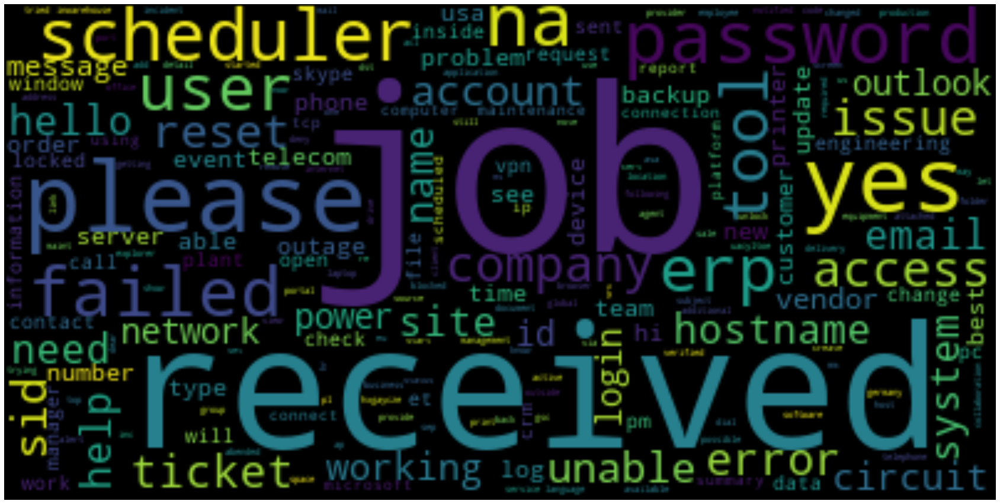

In [36]:
plot_cloud(' '.join(data[X0]))

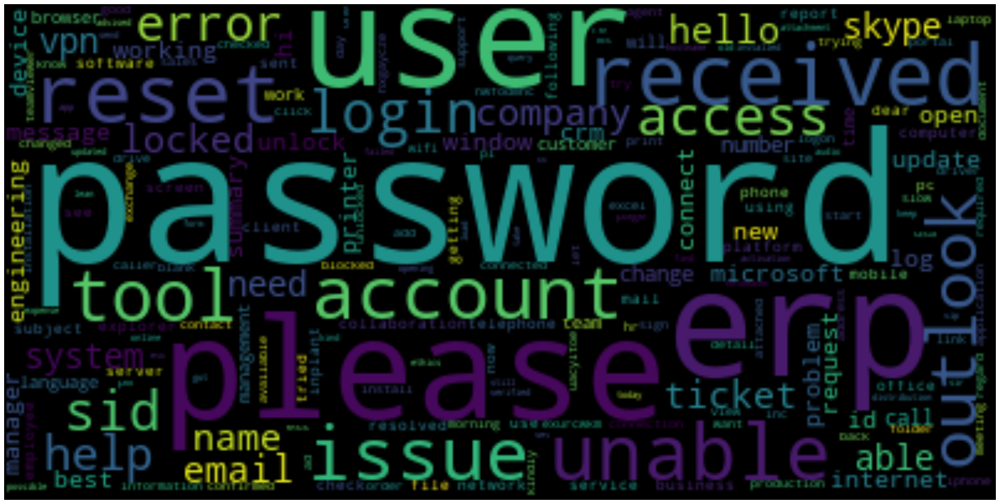

In [37]:
plot_cloud(' '.join(data_0[X0]))

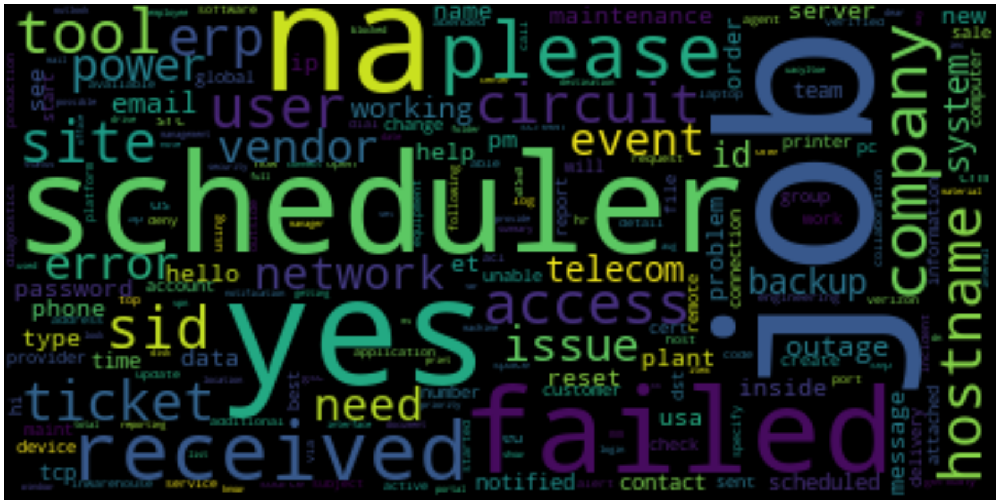

In [38]:
plot_cloud(' '.join(data_non_0[X0]))

All these word clouds are useful to detect some pattern of data having words like ***\_x000d\_*** needs to be removed. Word clouds can be used again and again to detect such data to clean data.

### Types of words used in particular group

Apart from finding the count of words per group, it is crucial to check what kind of words are used most in particular group. Some of the words can be specific to the group and can help to identify their group based on such keywords used

In [39]:
# Function to find common words for each defined category
def find_common_words_by_category(categories, N):
    common_words = {}
    for category in categories:
        category_text = [text for text in data[data[Y] == category][X0]]
        
        category_text = ' '.join(category_text).split()
        category_counter = Counter(category_text)
        cat_dict = {}
        for word in category_counter.most_common(N):
            cat_dict[word[0]] = word[1]
        common_words[category] = cat_dict
        
        word_statement = f"{category} has {common_words[category]}"
    return common_words

In [40]:
top_words = find_common_words_by_category(data[Y].unique(), 100)

In [41]:
def plot_cloud_freq(wordcloud_data):
    total_categories = len(wordcloud_data)
    fig = plt.figure(figsize=(20, 200))
    
    i = 0
    for category in wordcloud_data:
        wordcloud = cloud.generate_from_frequencies(wordcloud_data[category])
        ax= plt.subplot(int(total_categories / 2), 2, i + 1)
        im=ax.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(category, fontsize=16)
        i = i + 1
    plt.show()

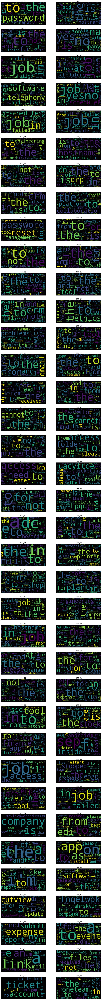

In [42]:
plot_cloud_freq(top_words)

Generating bigrams for further analysis

In [43]:
def get_bigram(texts):
    bigrams = list(nltk.bigrams(texts))
    bigrams_counter = Counter(bigrams)

    bigram_list = []
    for bigram in bigrams_counter.most_common():
        words = str(list(bigram[0]))
        count = bigram[1]
        bigram_list.append([words, count])

    columns = ['bigram', 'count']
    bigram_series = pd.DataFrame(bigram_list, columns=columns)
    return bigram_series
               
bigram_data = get_bigram(' '.join(data[X0]).split())
bigram_data_0 = get_bigram(' '.join(data_0[X0]).split())
bigram_data_non_0 = get_bigram(' '.join(data_non_0[X0]).split())

In [78]:
bigram_data_short = get_bigram(' '.join(data[X1].astype(str)).split())
bigram_data_0_short = get_bigram(' '.join(data_0[X1].astype(str)).split())
bigram_data_non_0_short = get_bigram(' '.join(data_non_0[X1].astype(str)).split())

In [79]:
bigram_data_short.head()

,bigram,count
0,"['job', 'scheduler']",959
1,"['in', 'job']",957
2,"['failed', 'in']",805
3,"['scheduler', 'at']",805
4,"['unable', 'to']",708


In [80]:
def bar_graph_bigram(data, title):
    configure_plotly_browser_state()

    fig = px.bar(data[:20], x='bigram', y='count', title=title, template='plotly_white', labels={'ngram': 'Bigram', 'count': 'Count'})
    fig.show()

In [81]:
bar_graph_bigram(bigram_data, "Counts of top bigrams")

In [82]:
bar_graph_bigram(bigram_data_0, "Counts of top bigrams for GRP_0")

In [83]:
bar_graph_bigram(bigram_data_non_0, "Counts of top bigrams for non GRP_0")

In [84]:
bar_graph_bigram(bigram_data_short, "Counts of top bigrams for Short Desc")

In [85]:
bar_graph_bigram(bigram_data_0_short, "Counts of top bigrams for Short Desc for GRP_0")

In [86]:
bar_graph_bigram(bigram_data_non_0_short, "Counts of top bigrams for Short Desc for non GRP_0")

Removing unwanted set of words like yes, na, received also greeting words like hi, hello would be much beneficial as they create no sense what so ever

In [91]:
text = [[text for text in doc.split()] for doc in data[X0]]
text_0 = [[text for text in doc.split()] for doc in data_0[X0]]
text_non_0 = [[text for text in doc.split()] for doc in data_non_0[X0]]

text_short = [[text for text in doc.split()] for doc in data[X1].astype(str)]
text_0_short = [[text for text in doc.split()] for doc in data_0[X1].astype(str)]
text_non_0_short = [[text for text in doc.split()] for doc in data_non_0[X1].astype(str)]

In [92]:
import gensim
from gensim import corpora
from gensim.utils import simple_preprocess

from gensim.models import Word2Vec
from sklearn.manifold import TSNE

In [93]:
VECTOR_SIZE = 100

model = Word2Vec(text, sg=1, min_count=1, size=VECTOR_SIZE)
model_0 = Word2Vec(text_0, sg=1, min_count=1, size=VECTOR_SIZE)
model_non_0 = Word2Vec(text_non_0, sg=1, min_count=1, size=VECTOR_SIZE)

model_short = Word2Vec(text_short, sg=1, min_count=1, size=VECTOR_SIZE)
model_0_short = Word2Vec(text_0_short, sg=1, min_count=1, size=VECTOR_SIZE)
model_non_0_short = Word2Vec(text_non_0_short, sg=1, min_count=1, size=VECTOR_SIZE)

In [94]:
print(model.wv.similarity('job', 'email'))
print(model_0.wv.similarity('job', 'email'))
print(model_non_0.wv.similarity('job', 'email'))

print(model_short.wv.similarity('job', 'email'))
print(model_0_short.wv.similarity('job', 'email'))
print(model_non_0_short.wv.similarity('job', 'email'))

0.37883583
0.7951526
0.42015377
0.40357962
0.99792266
0.552792


In [95]:
model.wv.similarity('job', 'scheduler')

0.9802613

In [96]:
model.wv.similarity('job', 'schedule')

0.5306119

In [97]:
model.wv.most_similar('job')[:5]

[('abended', 0.9806671142578125),
 ('scheduler', 0.9802613258361816),
 ('bwhrattr', 0.9708666205406189),
 ('tooldplcmmaninp', 0.9657208323478699),
 ('cold', 0.9631805419921875)]

In [98]:
model.wv.most_similar('equipment')[:5]

[('dial', 0.9612576365470886),
 ('verified', 0.8796939849853516),
 ('tone', 0.8576993942260742),
 ('na', 0.8556992411613464),
 ('iqshzdru', 0.8544161319732666)]

In [99]:
model.wv.most_similar('circuit')[:5]

[('backup', 0.882820725440979),
 ('secondary', 0.8644214868545532),
 ('africa', 0.8581572771072388),
 ('tikona', 0.8570723533630371),
 ('mbps', 0.8543569445610046)]

In [100]:
def display_closestwords_tsnescatterplot(model, word, size):
  arr = np.empty((0,size), dtype='f')
  word_labels = [word]
  close_words = model.wv.similar_by_word(word)
  arr = np.append(arr, np.array([model.wv[word]]), axis=0)
  for wrd_score in close_words:
    wrd_vector = model.wv[wrd_score[0]]
    word_labels.append(wrd_score[0])
    arr = np.append(arr, np.array([wrd_vector]), axis=0)
        
  tsne = TSNE(n_components=2, random_state=0)
  np.set_printoptions(suppress=True)
  Y = tsne.fit_transform(arr)
  x_coords = Y[:, 0]
  y_coords = Y[:, 1]
  plt.scatter(x_coords, y_coords)
  for label, x, y in zip(word_labels, x_coords, y_coords):
    plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
  
  plt.xlim(x_coords.min()+0.00005, x_coords.max()+0.00005)
  plt.ylim(y_coords.min()+0.00005, y_coords.max()+0.00005)
  plt.show()

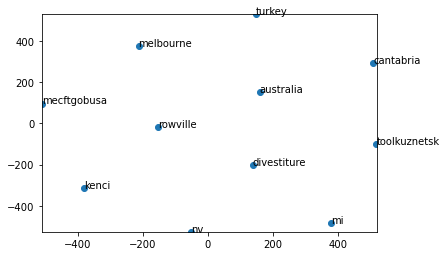

In [101]:
display_closestwords_tsnescatterplot(model, 'australia', VECTOR_SIZE)

In [102]:
from sklearn.decomposition import PCA

In [103]:
def show_word_scatter(model, plot_limit):
    pca = PCA(n_components=2)
    result = pca.fit_transform(model.wv[model.wv.vocab][:plot_limit])

    size = (30,15)
    fig, ax = plt.subplots(figsize=size)

    ax = plt.scatter(result[:, 0], result[:, 1])

    words = list(model.wv.vocab)[:plot_limit]
    for i, word in enumerate(words):
        plt.annotate(word, xy=(result[i, 0], result[i, 1]), fontsize=16)
    plt.show()

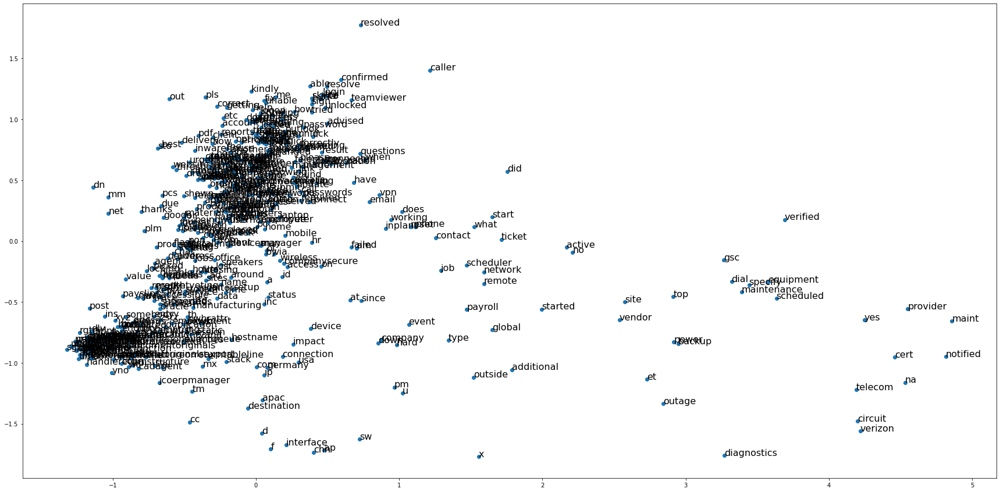

In [104]:
PLOT_LIMIT = 500
show_word_scatter(model, PLOT_LIMIT)

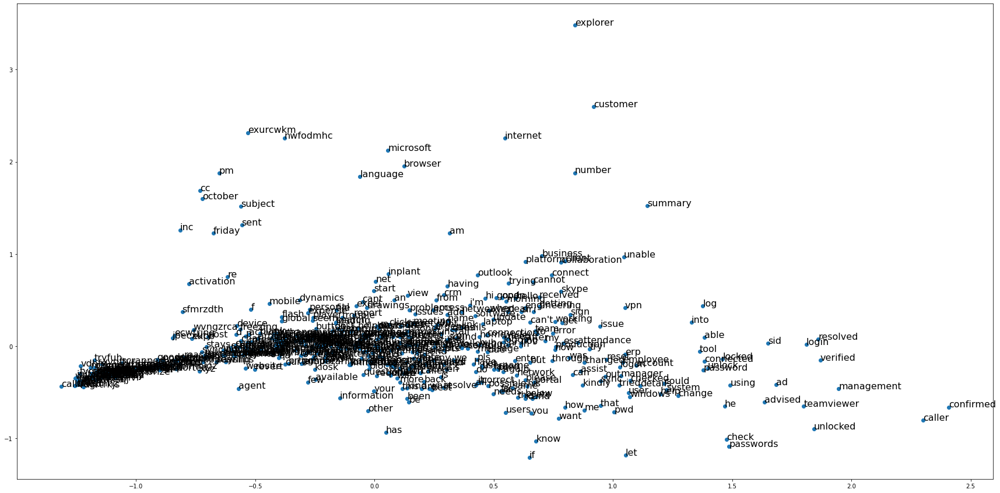

In [105]:
show_word_scatter(model_0, PLOT_LIMIT)

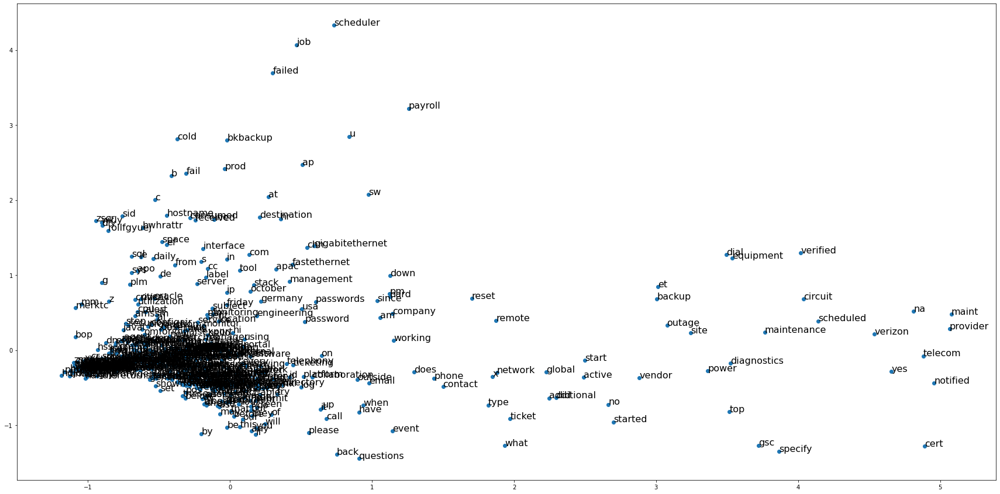

In [106]:
show_word_scatter(model_non_0, PLOT_LIMIT)

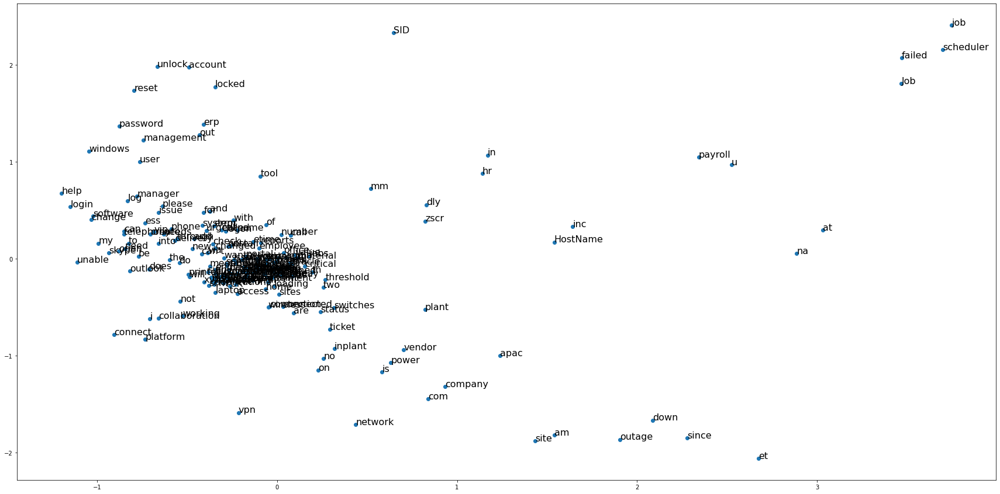

In [107]:
PLOT_LIMIT_SHORT = 200
show_word_scatter(model_short, PLOT_LIMIT_SHORT)

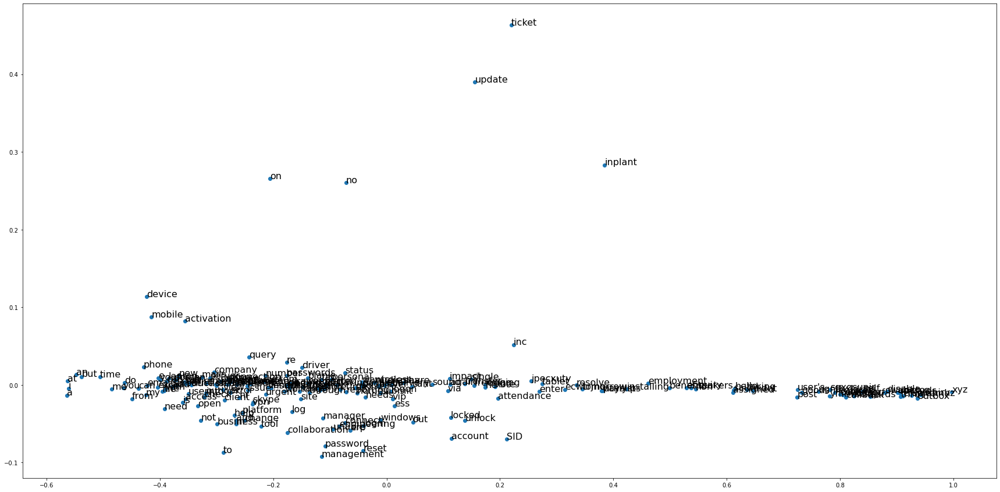

In [108]:
show_word_scatter(model_0_short, PLOT_LIMIT_SHORT)

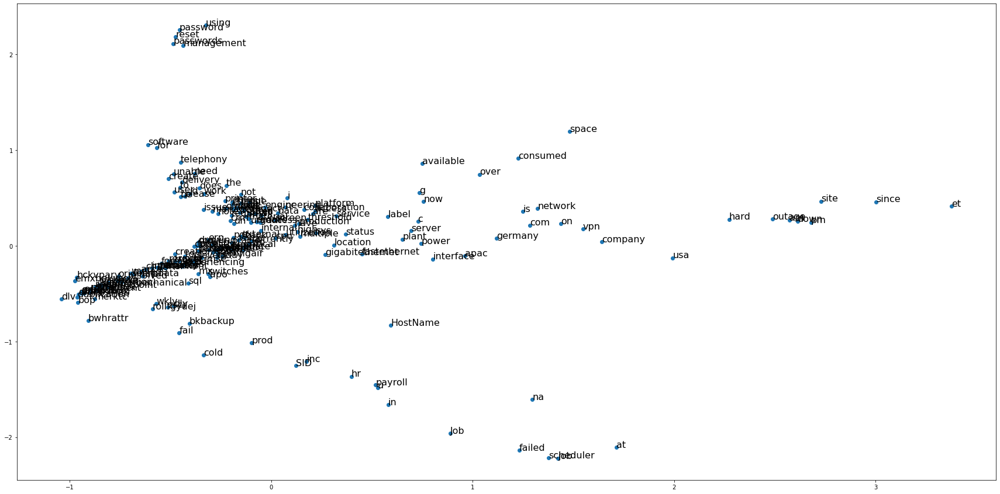

In [109]:
show_word_scatter(model_non_0_short, PLOT_LIMIT_SHORT)